# Mask R-CNN - Inspect Ballon Trained Model

Code and visualizations to test, debug, and evaluate the Mask R-CNN model.

In [1]:
model_op = 1 # 0 for the last trained and 1 for a specific epoch
epoch = "0100"

import os
import sys
import random
import math
import re
import time
import numpy as np
import tensorflow as tf
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.patches as patches

## confusion matrix

from mrcnn import utils_2
import pandas as pd

# Root directory of the project
ROOT_DIR = os.path.abspath("../../")

# Import Mask RCNN
sys.path.append(ROOT_DIR)  # To find local version of the library
from mrcnn import utils
from mrcnn import visualize
from mrcnn.visualize import display_images
import mrcnn.model as modellib
from mrcnn.model import log

from samples.pepper import pepper_dass

%matplotlib inline 

# Directory to save logs and trained model
MODEL_DIR = os.path.join(ROOT_DIR, "logs")

# Path to Ballon trained weights
# You can download this file from the Releases page
# https://github.com/matterport/Mask_RCNN/releases
PEPPER_WEIGHTS_PATH = "/path/to/mask_rcnn_pepper.h5"  # TODO: update this path

C:\Users\franz\.conda\envs\MASK_RCNN_env_v0\lib\site-packages\tensorflow\python\framework\dtypes.py:469: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
C:\Users\franz\.conda\envs\MASK_RCNN_env_v0\lib\site-packages\tensorflow\python\framework\dtypes.py:470: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
C:\Users\franz\.conda\envs\MASK_RCNN_env_v0\lib\site-packages\tensorflow\python\framework\dtypes.py:471: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint16 = np.dtype([("qint16", np.int16, 1)])
C:\Users\franz\.conda\envs\MASK_RCNN_env_v0\lib\s

In [2]:
import tensorflow as tf
print(tf.__version__)
print("\n")

sess = tf.Session(config=tf.ConfigProto(log_device_placement=True))
print("Num GPUs Available: ", sess, "\n")

from tensorflow.python.client import device_lib
print(device_lib.list_local_devices())

1.4.0


Num GPUs Available:  <tensorflow.python.client.session.Session object at 0x00000162A9C0EA58> 

[name: "/device:CPU:0"
device_type: "CPU"
memory_limit: 268435456
locality {
}
incarnation: 5971816263271300464
, name: "/device:GPU:0"
device_type: "GPU"
memory_limit: 77594624
locality {
  bus_id: 1
}
incarnation: 11637408435301142128
physical_device_desc: "device: 0, name: NVIDIA GeForce RTX 3060 Laptop GPU, pci bus id: 0000:01:00.0, compute capability: 8.6"
]


## Configurations

In [3]:
config = pepper_dass.PepperConfig()
PEPPER_DIR = os.path.join(ROOT_DIR, "dataset")

In [4]:
# Override the training configurations with a few
# changes for inferencing.
class InferenceConfig(config.__class__):
    # Run detection on one image at a time
    GPU_COUNT = 1
    IMAGES_PER_GPU = 1

config = InferenceConfig()
config.display()


Configurations:
BACKBONE                       resnet101
BACKBONE_STRIDES               [4, 8, 16, 32, 64]
BATCH_SIZE                     1
BBOX_STD_DEV                   [0.1 0.1 0.2 0.2]
COMPUTE_BACKBONE_SHAPE         None
DETECTION_MAX_INSTANCES        100
DETECTION_MIN_CONFIDENCE       0.85
DETECTION_NMS_THRESHOLD        0.3
FPN_CLASSIF_FC_LAYERS_SIZE     1024
GPU_COUNT                      1
GRADIENT_CLIP_NORM             5.0
IMAGES_PER_GPU                 1
IMAGE_CHANNEL_COUNT            3
IMAGE_MAX_DIM                  1024
IMAGE_META_SIZE                15
IMAGE_MIN_DIM                  800
IMAGE_MIN_SCALE                0
IMAGE_RESIZE_MODE              square
IMAGE_SHAPE                    [1024 1024    3]
LEARNING_MOMENTUM              0.9
LEARNING_RATE                  0.001
LOSS_WEIGHTS                   {'rpn_class_loss': 1.0, 'rpn_bbox_loss': 1.0, 'mrcnn_class_loss': 1.0, 'mrcnn_bbox_loss': 1.0, 'mrcnn_mask_loss': 1.0}
MASK_POOL_SIZE                 14
MASK_SHAPE        

## Notebook Preferences

In [5]:
# Device to load the neural network on.
# Useful if you're training a model on the same 
# machine, in which case use CPU and leave the
# GPU for training.
DEVICE = "/gpu:0"  # /cpu:0 or /gpu:0

# Inspect the model in training or inference modes
# values: 'inference' or 'training'
# TODO: code for 'training' test mode not ready yet
TEST_MODE = "inference"

In [6]:
def get_ax(rows=1, cols=1, size=16):
    """Return a Matplotlib Axes array to be used in
    all visualizations in the notebook. Provide a
    central point to control graph sizes.
    
    Adjust the size attribute to control how big to render images
    """
    _, ax = plt.subplots(rows, cols, figsize=(size*cols, size*rows))
    return ax

## Load Validation Dataset

In [7]:
# Load validation dataset
dataset = pepper_dass.PepperDataset()
dataset.load_pepper(PEPPER_DIR, "val")

# Must call before using the dataset
dataset.prepare()

print("Images: {}\nClasses: {}".format(len(dataset.image_ids), dataset.class_names))

Images: 240
Classes: ['BG', 'fruit', 'peduncle']


## Load Model

In [8]:
# Create model in inference mode
with tf.device(DEVICE):
    model = modellib.MaskRCNN(mode="inference", model_dir=MODEL_DIR,
                              config=config)

In [9]:
if model_op==0:
    # Load the last model you trained
    weights_path = model.find_last()
    epoch = 301
elif model_op==1:
    # Or, set path to a specific pepper weights file
    wp = "logs/pepper20221114T0223/mask_rcnn_pepper_" + epoch + ".h5"
    weights_path = os.path.join(ROOT_DIR, wp)

# Load weights
print("Loading weights ", weights_path)
model.load_weights(weights_path, by_name=True)

Loading weights  C:\Users\franz\mask_rcnn_models\tf1_test_model_env\Mask_RCNN\logs/pepper20221114T0223/mask_rcnn_pepper_0100.h5
Re-starting from epoch 100


## Run Detection

image ID: pepper._Color_1607625635334.58349609375000.png (78) C:\Users\franz\mask_rcnn_models\tf1_test_model_env\Mask_RCNN\dataset\val\_Color_1607625635334.58349609375000.png
Processing 1 images
image                    shape: (1024, 1024, 3)       min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 15)               min:    0.00000  max: 1024.00000  int32
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32
gt_class_id              shape: (10,)                 min:    1.00000  max:    2.00000  int32
gt_bbox                  shape: (10, 4)               min:   21.00000  max: 1023.00000  int32
gt_mask                  shape: (1024, 1024, 10)      min:    0.00000  max:    1.00000  bool
--- 1.1470000743865967 seconds ---
image ID: pepper._0__Color_1665762137971.72558593750000.png (4) C:\Users\franz\mask_rcnn_models\tf1_test_mode

gt_class_id              shape: (26,)                 min:    1.00000  max:    2.00000  int32
gt_bbox                  shape: (26, 4)               min:    0.00000  max:  987.00000  int32
gt_mask                  shape: (1024, 1024, 26)      min:    0.00000  max:    1.00000  bool
--- 1.6779983043670654 seconds ---
Average: 1.183934259414673 s


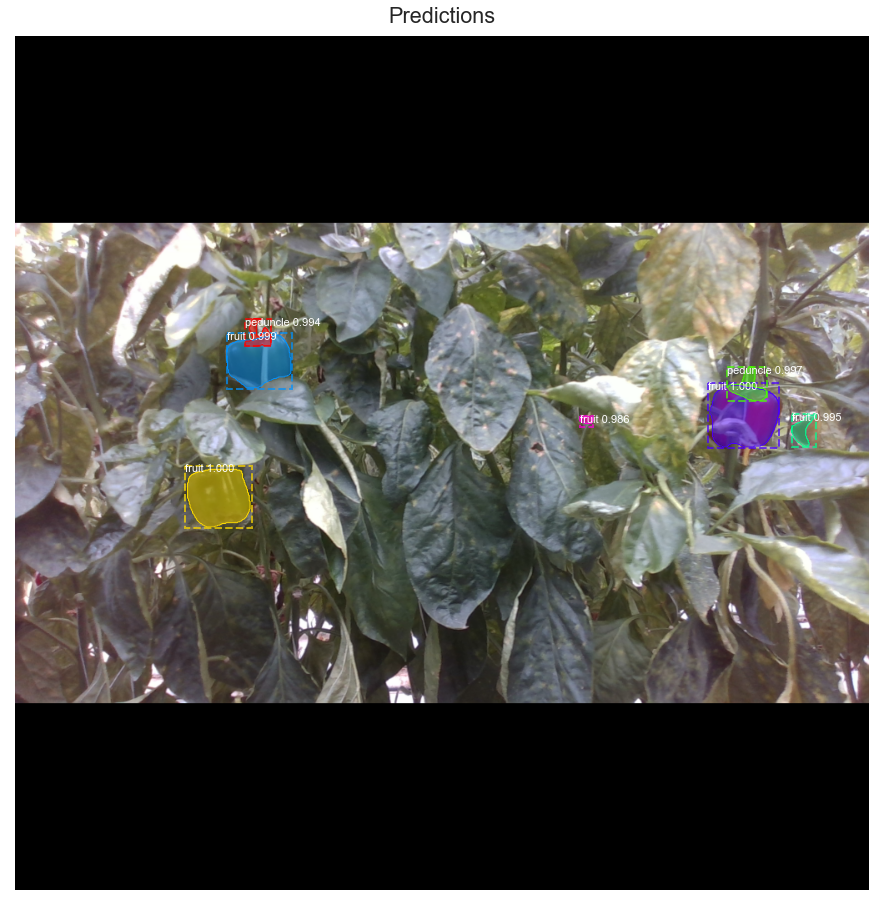

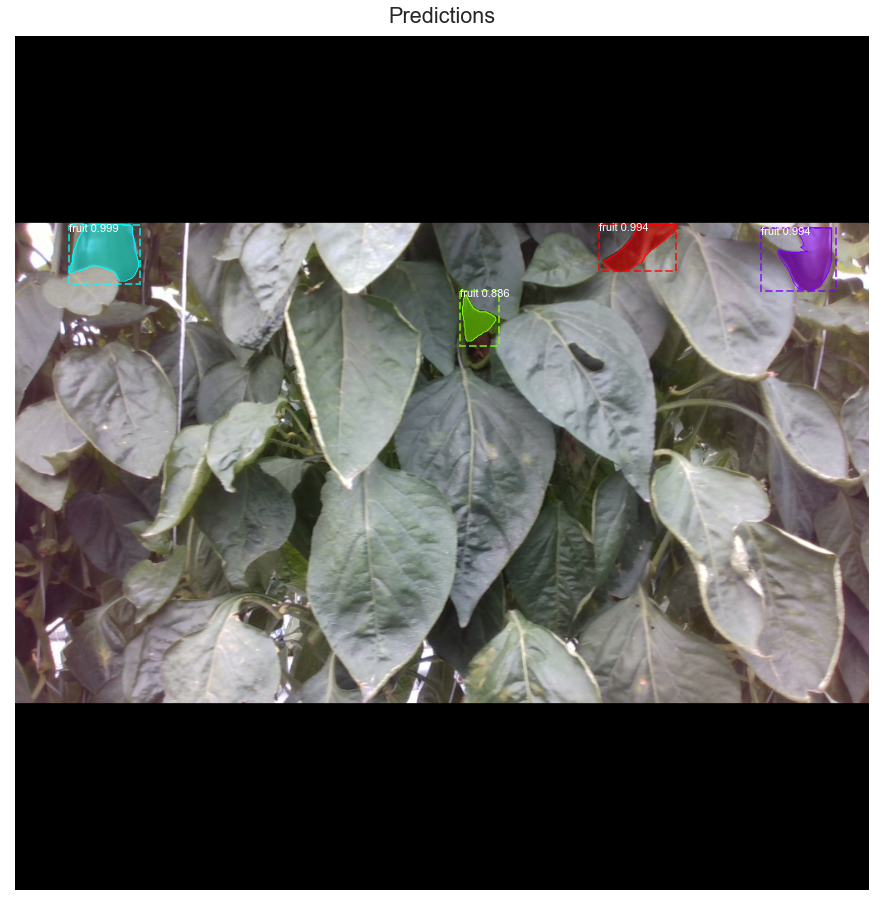

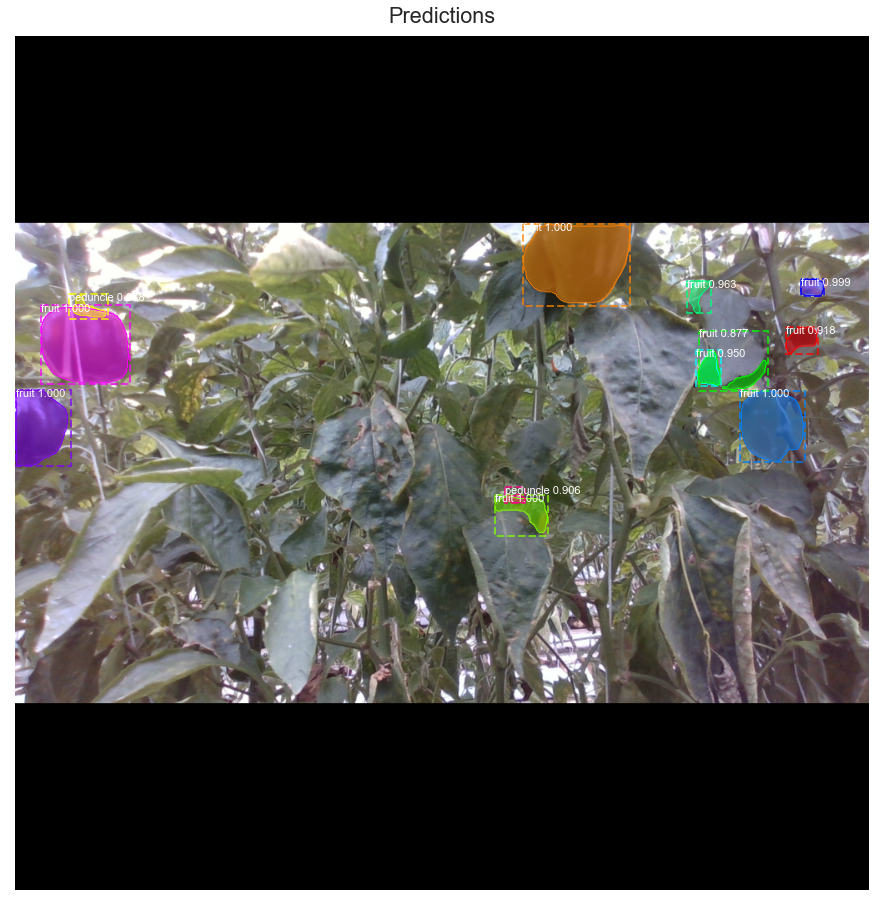

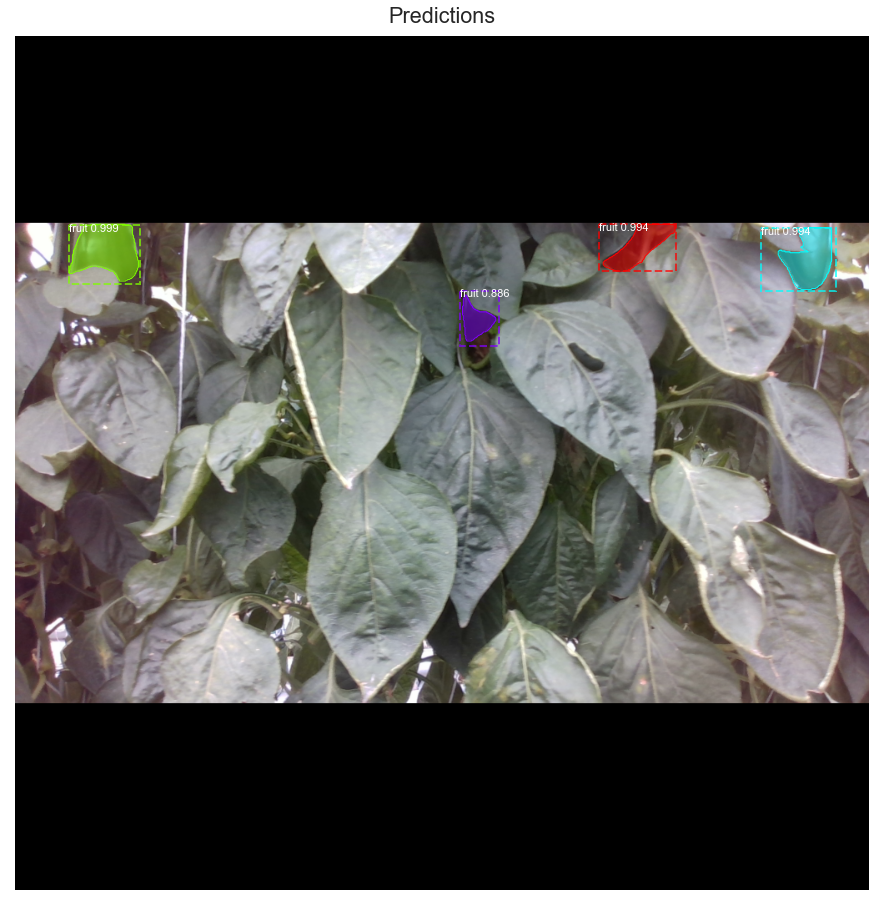

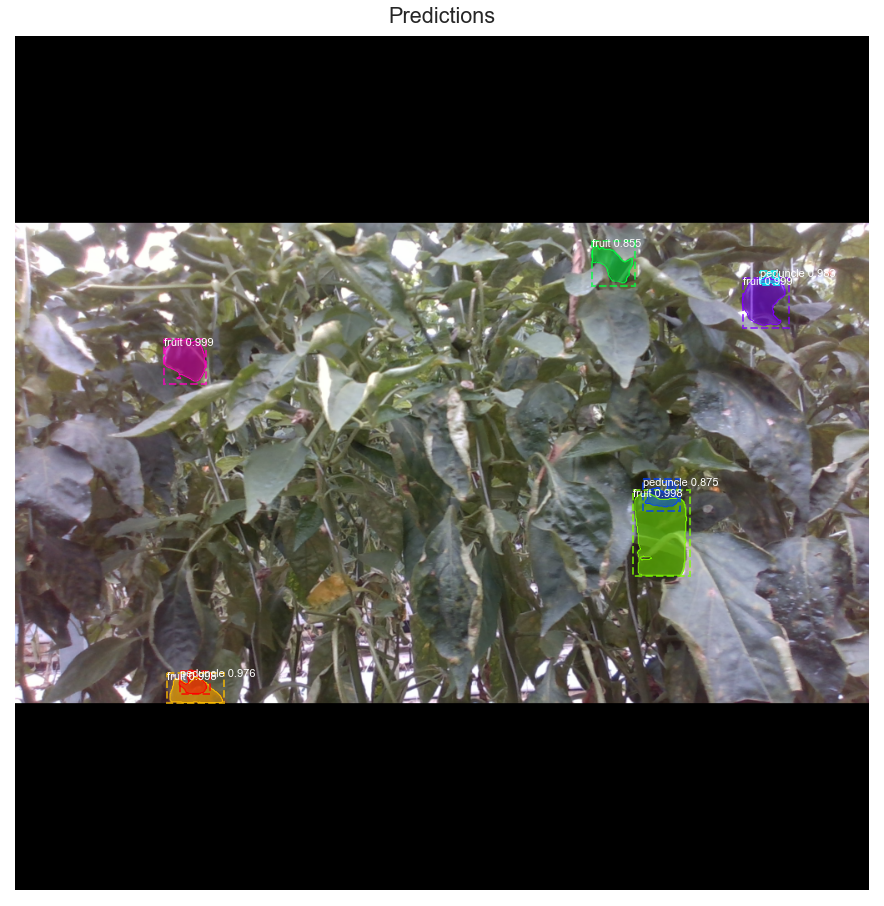

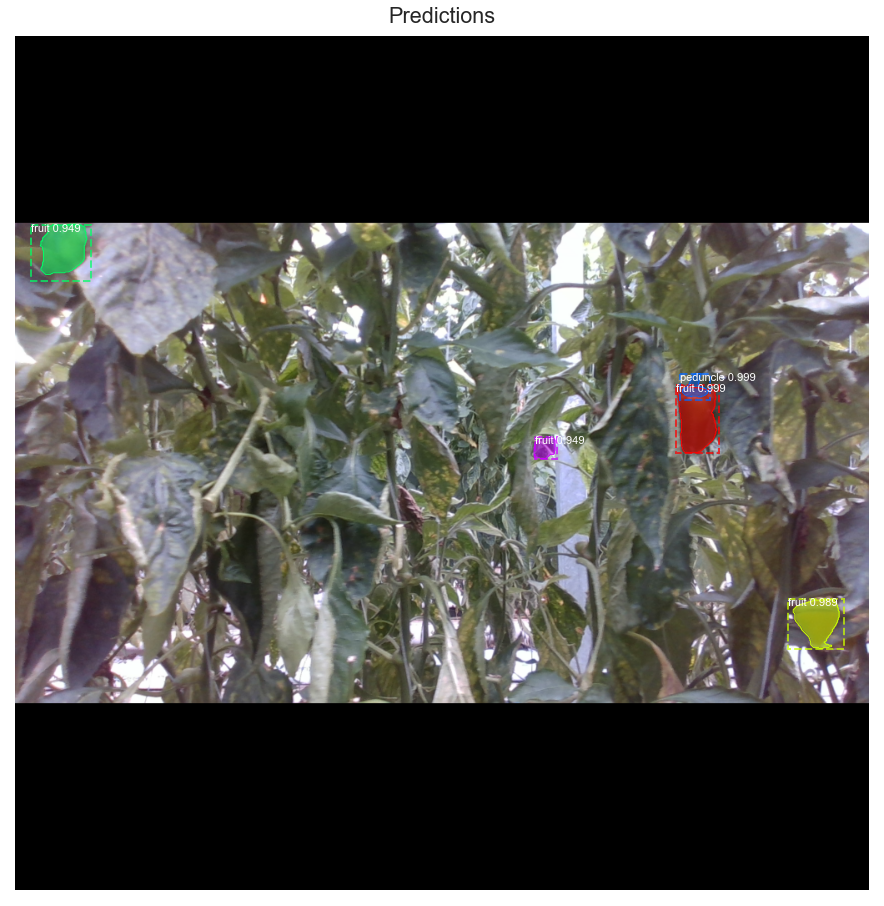

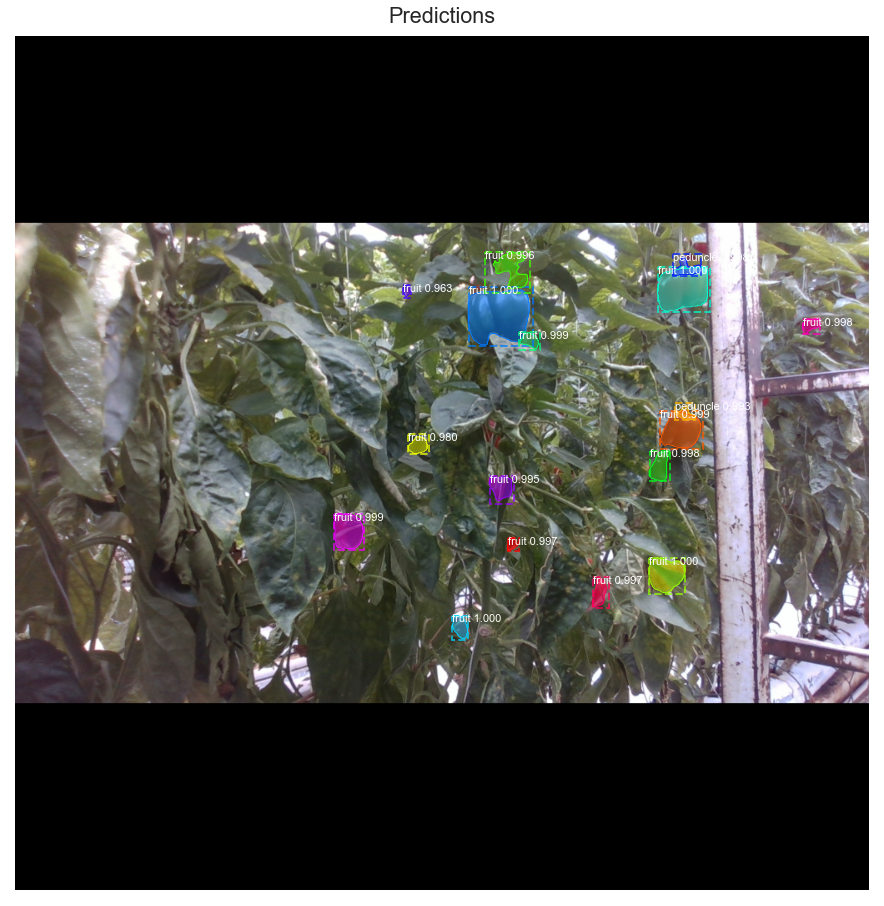

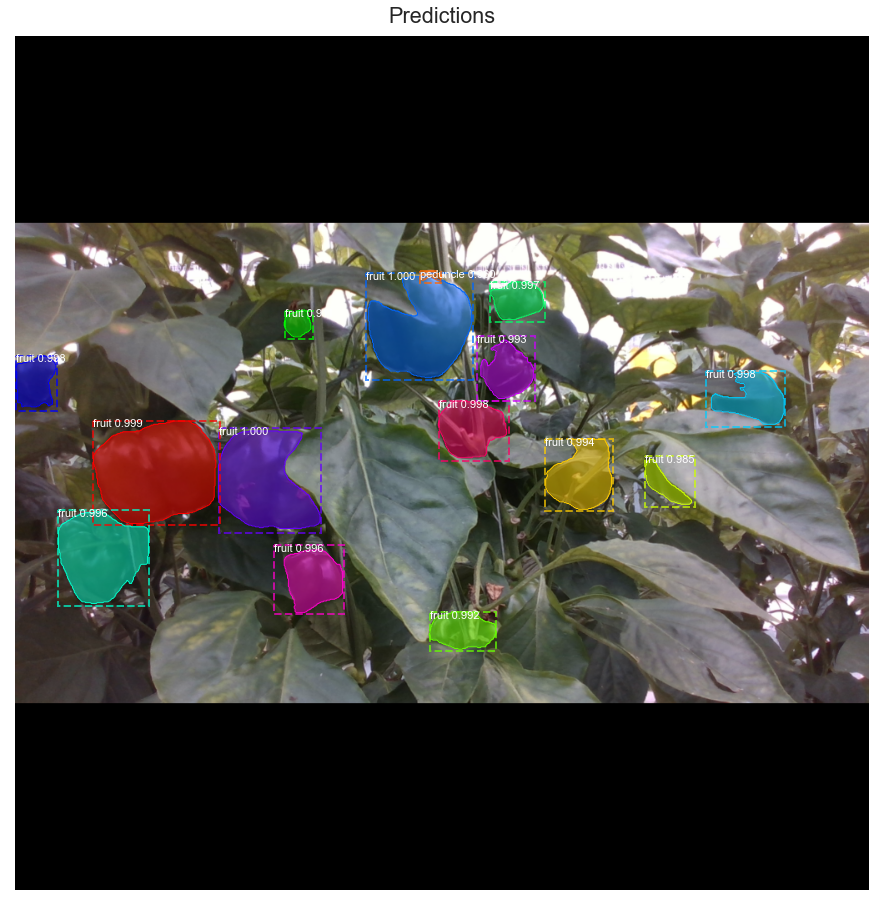

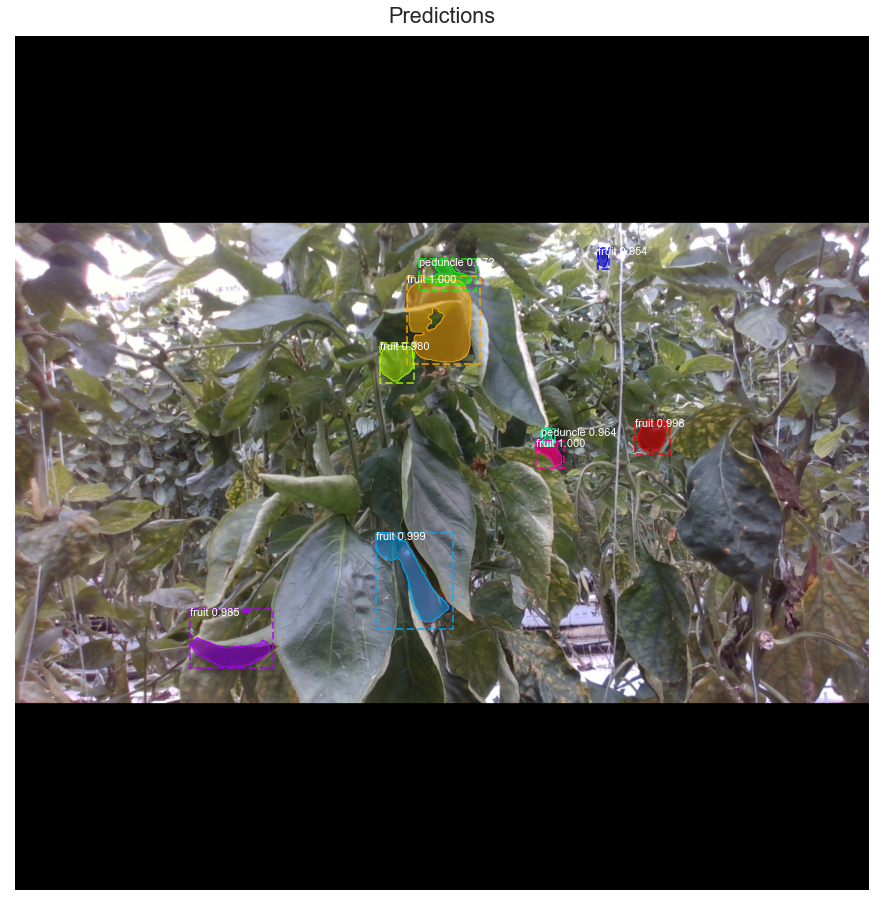

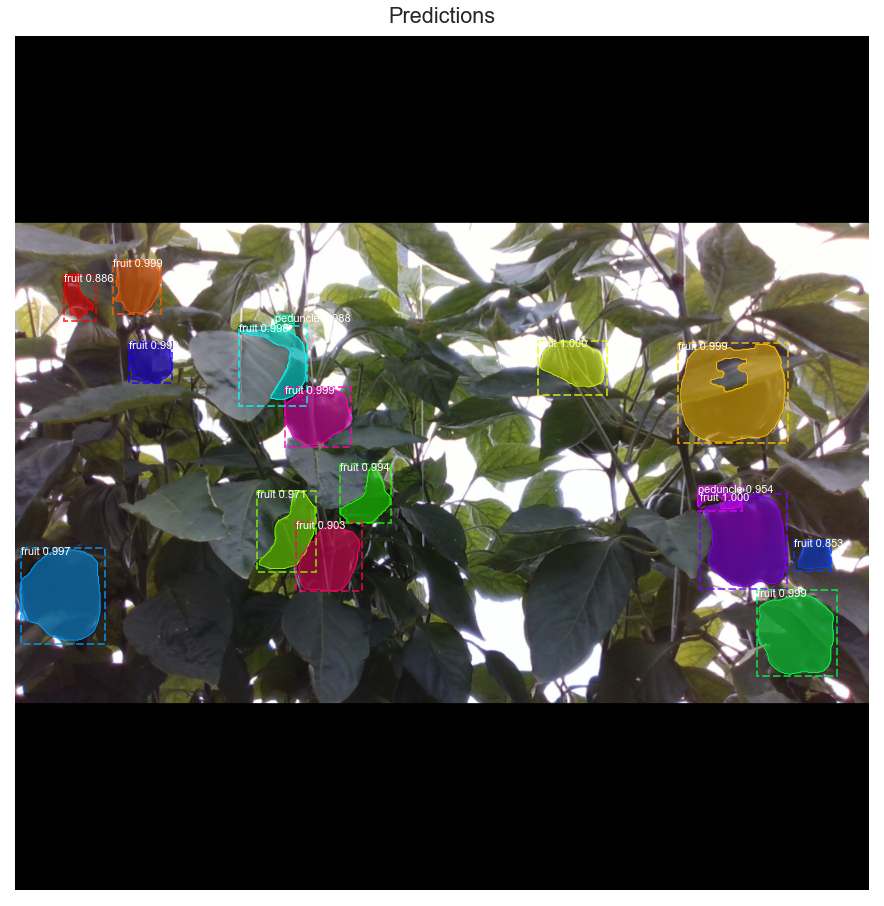

In [27]:
times = []

for i in range(10):

    start_time = time.time()

    image_id = random.choice(dataset.image_ids)
    #image_id = 171
    image, image_meta, gt_class_id, gt_bbox, gt_mask =\
        modellib.load_image_gt(dataset, config, image_id, use_mini_mask=False)
    info = dataset.image_info[image_id]
    print("image ID: {}.{} ({}) {}".format(info["source"], info["id"], image_id, 
                                        dataset.image_reference(image_id)))

    # Run object detection
    results = model.detect([image], verbose=1)

    # Display results
    ax = get_ax(1)
    r = results[0]
    visualize.display_instances(image, r['rois'], r['masks'], r['class_ids'], 
                                dataset.class_names, r['scores'], ax=ax,
                                title="Predictions")
    log("gt_class_id", gt_class_id)
    log("gt_bbox", gt_bbox)
    log("gt_mask", gt_mask)
    print("--- %s seconds ---" % (time.time() - start_time))

    times.append(time.time() - start_time)

avg = sum(times) / len(times)
print("Average: {} s".format(avg))


In [11]:
# r['class_ids']
desired_information = zip(r['rois'], r['class_ids'])
desired_information = list(desired_information)

    

### Precision-Recall

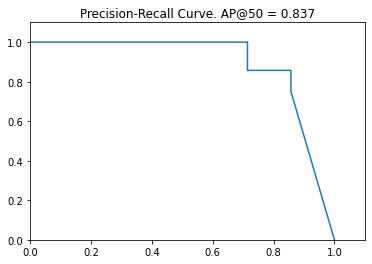

In [12]:
# Draw precision-recall curve
AP, precisions, recalls, overlaps = utils.compute_ap(gt_bbox, gt_class_id, gt_mask,
                                          r['rois'], r['class_ids'], r['scores'], r['masks'], class_id=1, ap_option=0)
visualize.plot_precision_recall(AP, precisions, recalls)

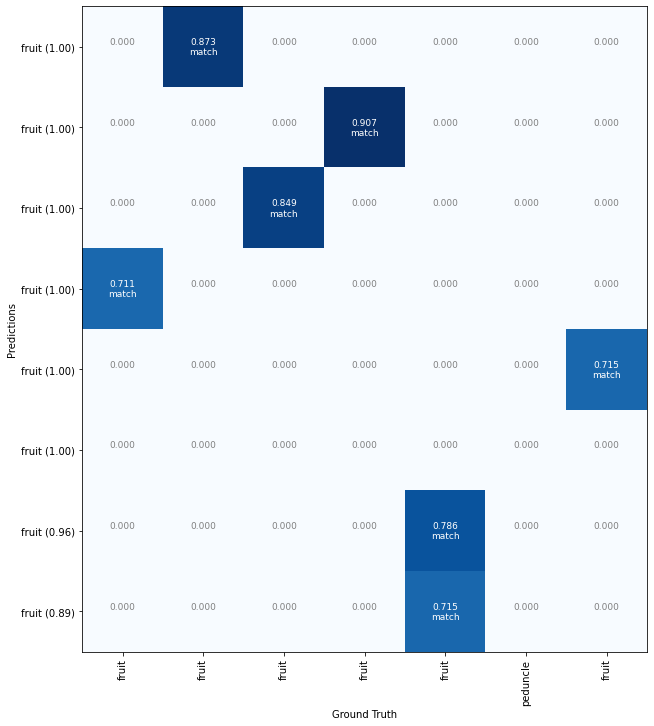

In [13]:
# Grid of ground truth objects and their predictions
visualize.plot_overlaps(gt_class_id, r['class_ids'], r['scores'],
                        overlaps, dataset.class_names)

### Compute mAP @ IoU=50 on Batch of Images

In [14]:
## original
"""

# Compute VOC-style Average Precision
def compute_batch_ap(image_ids):
    APs_general = []
    APs_fruit = []
    APs_peduncle = []
    
    Ps_general = []
    Ps_fruit = []
    Ps_peduncle = []
    
    Rs_general = []
    Rs_fruit = []
    Rs_peduncle = []
    
    
    
    for image_id in image_ids:
        # Load image
        image, image_meta, gt_class_id, gt_bbox, gt_mask =\
            modellib.load_image_gt(dataset, config,
                                   image_id, use_mini_mask=False)
        # Run object detection
        results = model.detect([image], verbose=0)
        # Compute AP
        r = results[0]
        
        # general
        AP_g, precisions_g, recalls_g, overlaps_g =\
            utils.compute_ap(gt_bbox, gt_class_id, gt_mask,
                              r['rois'], r['class_ids'], r['scores'], r['masks'], class_id=0, ap_option=0)
        APs_general.append(AP_g)
        
        precisions_gh = np.mean(precisions_g)
        Ps_general.append(precisions_gh)
        
        recalls_gh = np.mean(recalls_g)
        Rs_general.append(recalls_gh)
        print("Precisions_g: ", precisions_g)
        #print("AP_g: ", AP_g)
        
        # fruit
        AP_f, precisions_f, recalls_f, overlaps_f =\
            utils.compute_ap(gt_bbox, gt_class_id, gt_mask,
                              r['rois'], r['class_ids'], r['scores'], r['masks'], class_id=1, ap_option=1)
        APs_fruit.append(AP_f)
        
        precisions_fh = np.mean(precisions_f)
        Ps_fruit.append(precisions_fh)
        
        recalls_fh = np.mean(recalls_f)
        Rs_fruit.append(recalls_fh)
        
        print("Precisions_f: ", precisions_f)
        
        # peduncle
        AP_p, precisions_p, recalls_p, overlaps_p =\
            utils.compute_ap(gt_bbox, gt_class_id, gt_mask,
                              r['rois'], r['class_ids'], r['scores'], r['masks'], class_id=2, ap_option=1)
        if math.isnan(AP_p): AP_p = 0.0
        APs_peduncle.append(AP_p)
        
        precisions_ph = np.mean(precisions_p)
        Ps_peduncle.append(precisions_ph)
        
        for i in range(0, len(recalls_p)):
            if math.isnan(recalls_p[i]): recalls_p[i] = 0.0
        
        recalls_ph = np.mean(recalls_p)
        Rs_peduncle.append(recalls_ph)
        
        print("Precisions_p: ", precisions_p)
        
        #print(AP_p)
        
    return APs_general, APs_fruit, APs_peduncle, Ps_general, Ps_fruit, Ps_peduncle, Rs_general, Rs_fruit, Rs_peduncle

h = 1 # Last h

# Pick a set of random images
image_ids = np.random.choice(dataset.image_ids, h)
print("\n")
print(dataset.image_ids)
print("\n")
print(image_ids)
APs_g, APs_f, APs_p, Ps_g, Ps_f, Ps_p, Rs_g, Rs_f, Rs_p = compute_batch_ap(image_ids)

print("\n")
print("Epoch: ", int(epoch))
print("Weights path : ", weights_path)

print("\n")
print("mAP general  @ IoU=50 : ", np.mean(APs_g))
print("precision general     : ", np.mean(Ps_g))
print("recall general        : ", np.mean(Rs_g))

print("\n")
print("mAP fruit    @ IoU=50 : ", np.mean(APs_f))
print("precision fruit       : ", np.mean(Ps_f))
print("recall fruit          : ", np.mean(Rs_f))


print("\n")
print("mAP peduncle @ IoU=50 : ", np.mean(APs_p))
print("precision peduncle    : ", np.mean(Ps_p))
print("recall peduncle       : ", np.mean(Rs_p))

print("\n")
print("Number of random images: ", h)

    """
x = 0

AP_g:  0.6666666815678278
AP_g:  0.5000000149011612
AP_g:  0.6000000238418579
AP_g:  0.6624999903142452
AP_g:  0.5555555820465088
AP_g:  0.7638889029622078
AP_g:  0.5
AP_g:  0.5232906162738801
AP_g:  0.597866415977478
AP_g:  0.75
AP_g:  0.7500000149011612
AP_g:  0.7024793516505848
AP_g:  0.8899999797344208
AP_g:  0.7853535330957837
AP_g:  0.5500957340329558
AP_g:  0.5735714490924563
AP_g:  0.493939408659935
AP_g:  0.6507936716079712
AP_g:  0.800000011920929
AP_g:  0.6449760797253827
AP_g:  0.5412037277387248
AP_g:  0.8181818127632141
AP_g:  0.74125875397162
AP_g:  0.6431905193160278
AP_g:  0.9166666716337204
AP_g:  0.5979174044953675
AP_g:  0.762237776409496
AP_g:  0.8134982440597522
AP_g:  0.5571428792817252
AP_g:  0.7272727489471436
AP_g:  1.0
AP_g:  0.7444444563653734
AP_g:  0.8333333134651184
AP_g:  0.6431905193160278
AP_g:  0.5194805396067631
AP_g:  0.550000011920929
AP_g:  0.4236111111111111
AP_g:  0.7599999904632568
AP_g:  0.49242425709962845
AP_g:  0.333333338300387
AP_g:  0.95

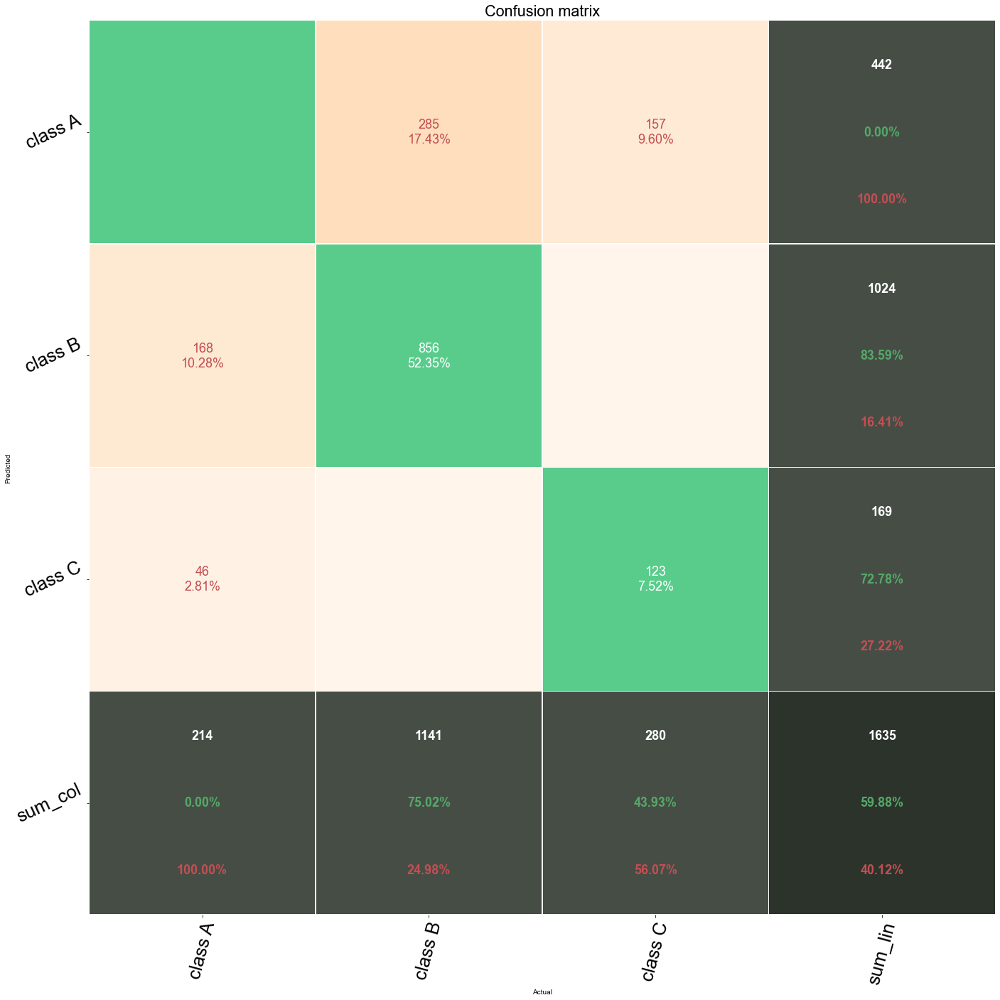

tp for each class with bg : [0, 856, 123]
fp for each class with bg : [442, 168, 46]
fn for each class with bg : [214, 285, 157]

########################

tp for each class final : [856, 123]
fp for each class final : [168, 46]
fn for each class final : [285, 157]


Epoch:  100
Weights path :  C:\Users\franz\mask_rcnn_models\tf1_test_model_env\Mask_RCNN\logs/pepper20221114T0223/mask_rcnn_pepper_0100.h5


mAP general  @ IoU=50 :  0.6513055167794752
precision general     :  0.781874075443787
recall general        :  0.5947524101665206


precision fruit       :  0.8359375
recall fruit          :  0.7502191060473269


precision peduncle    :  0.727810650887574
recall peduncle       :  0.4392857142857143


Number of random images:  100


In [15]:
## FINAL precision and recall test

# Compute VOC-style Average Precision
def compute_batch_ap(image_ids):
    
    APs_general = []
    
    #ground-truth and predictions lists
    gt_tot = []
    pred_tot = []
    
    for image_id in image_ids:
        # Load image
        image, image_meta, gt_class_id, gt_bbox, gt_mask =\
            modellib.load_image_gt(dataset, config,
                                   image_id, use_mini_mask=False)
        # Run object detection
        results = model.detect([image], verbose=0)
        # Compute AP
        r = results[0]
        
        # general
        AP_g, precisions_g, recalls_g, overlaps_g =\
            utils.compute_ap(gt_bbox, gt_class_id, gt_mask,
                              r['rois'], r['class_ids'], r['scores'], r['masks'], class_id=0, ap_option=0)
        APs_general.append(AP_g)
        
        #print("Precisions_g: ", precisions_g)
        #print("r-class_ids", r['class_ids'])
        #print("r-rois", r['rois'])
        #print("gt_class_id", gt_class_id)
        #print("gt_bbox", gt_bbox)
        print("AP_g: ", AP_g)
        
        #compute gt_tot and pred_tot
        gt, pred = utils_2.gt_pred_lists(gt_class_id, gt_bbox, r['class_ids'], r['rois'])
        gt_tot = np.append(gt_tot, gt)
        pred_tot = np.append(pred_tot, pred)
        
        #check if the vectors len are equal
        #print("gt", gt)
        #print("pred", pred)
        
        #print("the actual len of the gt vect is : ", len(gt_tot))
        #print("the actual len of the pred vect is : ", len(pred_tot))
        
        #print("Ground truth object : "+dataset.class_names[gt])
        #print("Predicted object : "+dataset.class_names[pred])
        
        gt_tot=gt_tot.astype(int)
        pred_tot=pred_tot.astype(int)
        
    print("\n")
    print("gt_tot   ", gt_tot)
    print("pred_tot ", pred_tot)
    
    tp,fp,fn=utils_2.plot_confusion_matrix_from_data(gt_tot,pred_tot,fz=18, figsize=(20,20), lw=0.5)

    print("tp for each class with bg :",tp)
    print("fp for each class with bg :",fp)
    print("fn for each class with bg :",fn)

    #eliminate the background class (class A) from tps fns and fns lists since it doesn't concern us anymore : 
    del tp[0]
    del fp[0]
    del fn[0]

    print("\n########################\n")
    print("==========")
    print("tp for each class final :",tp)
    print("fp for each class final :",fp)
    print("fn for each class final :",fn)
    print("==========")
    
    precision_f = (tp[0])/(tp[0]+fp[0])
    precision_p = (tp[1])/(tp[1]+fp[1])
    precision_g = (precision_f+precision_p)/(2)

    recall_f = (tp[0])/(tp[0]+fn[0])
    recall_p = (tp[1])/(tp[1]+fn[1])
    recall_g = (recall_f+recall_p)/(2)
        
    return APs_general, precision_g, precision_f, precision_p, recall_g, recall_f, recall_p, gt_tot, pred_tot

h = 100 # Last h

# Pick a set of random images
image_ids = np.random.choice(dataset.image_ids, h)
APs_g, precision_g, precision_f, precision_p, recall_g, recall_f, recall_p, gt_tot, pred_tot = compute_batch_ap(image_ids)

#"""
print("\n")
print("Epoch: ", int(epoch))
print("Weights path : ", weights_path)

print("\n")
print("mAP general  @ IoU=50 : ", np.mean(APs_g))
print("precision general     : ", precision_g)
print("recall general        : ", recall_g)

print("\n")
print("precision fruit       : ", precision_f)
print("recall fruit          : ", recall_f)


print("\n")
print("precision peduncle    : ", precision_p)
print("recall peduncle       : ", recall_p)

print("\n")
print("Number of random images: ", h)
    #"""


In [16]:
==========
tp for each class final : [907, 145]
fp for each class final : [166, 57]
fn for each class final : [241, 120]
==========


Epoch:  100
Weights path :  C:\Users\franz\mask_rcnn_models\tf1_test_model_env\Mask_RCNN\logs/pepper20221114T0223/mask_rcnn_pepper_0100.h5


mAP general  @ IoU=50 :  0.726403682697018
precision general     :  0.7815576758048591
recall general        :  0.6686197488659522


precision fruit       :  0.8452935694315005
recall fruit          :  0.7900696864111498


precision peduncle    :  0.7178217821782178
recall peduncle       :  0.5471698113207547


Number of random images:  100

SyntaxError: invalid syntax (<ipython-input-16-b3a5ebace728>, line 1)

In [ ]:
++++ trying new besto per 100

==========
tp for each class final : [934, 101]
fp for each class final : [265, 56]
fn for each class final : [262, 147]
==========


Epoch:  100
Weights path :  C:\Users\franz\mask_rcnn_models\tf1_test_model_env\Mask_RCNN\logs/pepper20221114T0223/mask_rcnn_pepper_0100.h5


mAP general  @ IoU=50 :  0.6943339450810447
precision general     :  0.7111472936576659
recall general        :  0.5940972596828137


precision fruit       :  0.7789824854045038
recall fruit          :  0.7809364548494984


precision peduncle    :  0.643312101910828
recall peduncle       :  0.40725806451612906


Number of random images:  100
    
    ===========
    
    ==========
tp for each class final : [918, 97]
fp for each class final : [192, 48]
fn for each class final : [273, 137]
==========


Epoch:  100
Weights path :  C:\Users\franz\mask_rcnn_models\tf1_test_model_env\Mask_RCNN\logs/pepper20221114T0223/mask_rcnn_pepper_0100.h5


mAP general  @ IoU=50 :  0.7044869925217943
precision general     :  0.7479962721342032
recall general        :  0.5926553854765442


precision fruit       :  0.827027027027027
recall fruit          :  0.7707808564231738


precision peduncle    :  0.6689655172413793
recall peduncle       :  0.41452991452991456


Number of random images:  100
    
     ===========

        
    
    
     ===========

        
    
    
     ===========

        
    
    
     ===========

        
    
    
     ===========

        
    
    
     ===========

        
    
    
     ===========

        
    
    
     ===========

        
        

In [ ]:
++++ besto

==========
tp for each class final : [446, 56]
fp for each class final : [102, 23]
fn for each class final : [117, 55]
==========


Epoch:  100
Weights path :  C:\Users\franz\mask_rcnn_models\tf1_test_model_env\Mask_RCNN\logs/pepper20221114T0223/mask_rcnn_pepper_0100.h5


mAP general  @ IoU=50 :  0.7379657977620849
precision general     :  0.7613646863161785
recall general        :  0.6483446145968348


precision fruit       :  0.8138686131386861
recall fruit          :  0.7921847246891652


precision peduncle    :  0.7088607594936709
recall peduncle       :  0.5045045045045045


Number of random images:  50

++++

## Results

In [ ]:
==========
tp for each class final : [438, 45]
fp for each class final : [136, 19]
fn for each class final : [145, 81]
==========


Epoch:  49
Weights path :  C:\Users\franz\mask_rcnn_models\tf1_test_model_env\Mask_RCNN\logs/pepper20221114T0223/mask_rcnn_pepper_0049.h5


mAP general  @ IoU=50 :  0.6295738320384373
precision general     :  0.7330956010452961
recall general        :  0.5542146532712571


precision fruit       :  0.7630662020905923
recall fruit          :  0.7512864493996569


precision peduncle    :  0.703125
recall peduncle       :  0.35714285714285715


Number of random images:  50

======

==========
tp for each class final : [882, 104]
fp for each class final : [223, 36]
fn for each class final : [255, 161]
==========


Epoch:  49
Weights path :  C:\Users\franz\mask_rcnn_models\tf1_test_model_env\Mask_RCNN\logs/pepper20221114T0223/mask_rcnn_pepper_0049.h5


mAP general  @ IoU=50 :  0.658412006508005
precision general     :  0.7705235940530059
recall general        :  0.5840892119281127


precision fruit       :  0.7981900452488688
recall fruit          :  0.7757255936675461


precision peduncle    :  0.7428571428571429
recall peduncle       :  0.39245283018867927


Number of random images:  100

In [ ]:
==========
tp for each class final : [381, 59]
fp for each class final : [74, 19]
fn for each class final : [128, 50]
==========


Epoch:  100
Weights path :  C:\Users\franz\mask_rcnn_models\tf1_test_model_env\Mask_RCNN\logs/pepper20221114T0223/mask_rcnn_pepper_0100.h5


mAP general  @ IoU=50 :  0.6737387623882017
precision general     :  0.7968864468864469
recall general        :  0.6449054631315225


precision fruit       :  0.8373626373626374
recall fruit          :  0.7485265225933202


precision peduncle    :  0.7564102564102564
recall peduncle       :  0.5412844036697247


Number of random images:  50

======

==========
tp for each class final : [834, 92]
fp for each class final : [229, 48]
fn for each class final : [288, 164]
==========


Epoch:  100
Weights path :  C:\Users\franz\mask_rcnn_models\tf1_test_model_env\Mask_RCNN\logs/pepper20221114T0223/mask_rcnn_pepper_0100.h5


mAP general  @ IoU=50 :  0.6435245380494624
precision general     :  0.7208574116382207
recall general        :  0.5513452540106951


precision fruit       :  0.7845719661335842
recall fruit          :  0.7433155080213903


precision peduncle    :  0.6571428571428571
recall peduncle       :  0.359375


Number of random images:  100

In [ ]:
==========
tp for each class final : [442, 55]
fp for each class final : [169, 34]
fn for each class final : [135, 81]
==========


Epoch:  150
Weights path :  C:\Users\franz\mask_rcnn_models\tf1_test_model_env\Mask_RCNN\logs/pepper20221114T0223/mask_rcnn_pepper_0150.h5


mAP general  @ IoU=50 :  0.6342320905343902
precision general     :  0.6706908917045182
recall general        :  0.5852214802732185


precision fruit       :  0.723404255319149
recall fruit          :  0.7660311958405546


precision peduncle    :  0.6179775280898876
recall peduncle       :  0.40441176470588236


Number of random images:  50

======

==========
tp for each class final : [845, 115]
fp for each class final : [236, 64]
fn for each class final : [274, 127]
==========


Epoch:  150
Weights path :  C:\Users\franz\mask_rcnn_models\tf1_test_model_env\Mask_RCNN\logs/pepper20221114T0223/mask_rcnn_pepper_0150.h5


mAP general  @ IoU=50 :  0.6751979052488583
precision general     :  0.7120708634153148
recall general        :  0.6151725640514332


precision fruit       :  0.7816836262719704
recall fruit          :  0.7551385165326184


precision peduncle    :  0.6424581005586593
recall peduncle       :  0.47520661157024796


Number of random images:  100

In [ ]:
==========
tp for each class final : [452, 76]
fp for each class final : [131, 53]
fn for each class final : [132, 61]
==========


Epoch:  200
Weights path :  C:\Users\franz\mask_rcnn_models\tf1_test_model_env\Mask_RCNN\logs/pepper20221114T0223/mask_rcnn_pepper_0200.h5


mAP general  @ IoU=50 :  0.6463200077503332
precision general     :  0.682223729174146
recall general        :  0.6643585641435856


precision fruit       :  0.7753001715265866
recall fruit          :  0.773972602739726


precision peduncle    :  0.5891472868217055
recall peduncle       :  0.5547445255474452


Number of random images:  50

======

==========
tp for each class final : [884, 123]
fp for each class final : [273, 85]
fn for each class final : [315, 118]
==========


Epoch:  200
Weights path :  C:\Users\franz\mask_rcnn_models\tf1_test_model_env\Mask_RCNN\logs/pepper20221114T0223/mask_rcnn_pepper_0200.h5


mAP general  @ IoU=50 :  0.6545342482305609
precision general     :  0.6776955488331893
recall general        :  0.6238272557698497


precision fruit       :  0.7640449438202247
recall fruit          :  0.737281067556297


precision peduncle    :  0.5913461538461539
recall peduncle       :  0.5103734439834025


Number of random images:  100

In [ ]:
==========
tp for each class final : [364, 37]
fp for each class final : [133, 13]
fn for each class final : [170, 56]
==========


Epoch:  250
Weights path :  C:\Users\franz\mask_rcnn_models\tf1_test_model_env\Mask_RCNN\logs/pepper20221114T0223/mask_rcnn_pepper_0250.h5


mAP general  @ IoU=50 :  0.6144920388627438
precision general     :  0.7361971830985916
recall general        :  0.5397487012202489


precision fruit       :  0.7323943661971831
recall fruit          :  0.6816479400749064


precision peduncle    :  0.74
recall peduncle       :  0.3978494623655914


Number of random images:  50

======

==========
tp for each class final : [849, 108]
fp for each class final : [263, 45]
fn for each class final : [279, 157]
==========


Epoch:  250
Weights path :  C:\Users\franz\mask_rcnn_models\tf1_test_model_env\Mask_RCNN\logs/pepper20221114T0223/mask_rcnn_pepper_0250.h5


mAP general  @ IoU=50 :  0.6557535408723951
precision general     :  0.734685780787135
recall general        :  0.5801033721397029


precision fruit       :  0.7634892086330936
recall fruit          :  0.7526595744680851


precision peduncle    :  0.7058823529411765
recall peduncle       :  0.4075471698113208


Number of random images:  100

In [ ]:
==========
tp for each class final : [419, 51]
fp for each class final : [127, 29]
fn for each class final : [126, 50]
==========


Epoch:  301
Weights path :  C:\Users\franz\mask_rcnn_models\tf1_test_model_env\Mask_RCNN\logs/pepper20221114T0223/mask_rcnn_pepper_0301.h5


mAP general  @ IoU=50 :  0.6802801033978862
precision general     :  0.7024496336996338
recall general        :  0.6368789172495231


precision fruit       :  0.7673992673992674
recall fruit          :  0.7688073394495413


precision peduncle    :  0.6375
recall peduncle       :  0.504950495049505


Number of random images:  50

======

==========
tp for each class final : [856, 119]
fp for each class final : [224, 69]
fn for each class final : [285, 95]
==========


Epoch:  301
Weights path :  C:\Users\franz\mask_rcnn_models\tf1_test_model_env\Mask_RCNN\logs/pepper20221114T0223/mask_rcnn_pepper_0301.h5


mAP general  @ IoU=50 :  0.6674904570639378
precision general     :  0.712785657998424
recall general        :  0.6531469362012335


precision fruit       :  0.7925925925925926
recall fruit          :  0.7502191060473269


precision peduncle    :  0.6329787234042553
recall peduncle       :  0.5560747663551402


Number of random images:  100

## Resultados extra

In [ ]:
==========
tp for each class final : [354, 53]
fp for each class final : [93, 21]
fn for each class final : [110, 53]
==========


Epoch:  100
Weights path :  C:\Users\franz\mask_rcnn_models\tf1_test_model_env\Mask_RCNN\logs/pepper20221114T0223/mask_rcnn_pepper_0100.h5


mAP general  @ IoU=50 :  0.6826334127056426
precision general     :  0.7540812624705242
recall general        :  0.6314655172413793


precision fruit       :  0.7919463087248322
recall fruit          :  0.7629310344827587


precision peduncle    :  0.7162162162162162
recall peduncle       :  0.5


Number of random images:  50

======

==========
tp for each class final : [496, 69]
fp for each class final : [109, 26]
fn for each class final : [148, 94]
==========


Epoch:  100
Weights path :  C:\Users\franz\mask_rcnn_models\tf1_test_model_env\Mask_RCNN\logs/pepper20221114T0223/mask_rcnn_pepper_0100.h5


mAP general  @ IoU=50 :  0.6753459347656551
precision general     :  0.773075250108743
recall general        :  0.5967496094196547


precision fruit       :  0.8198347107438017
recall fruit          :  0.7701863354037267


precision peduncle    :  0.7263157894736842
recall peduncle       :  0.4233128834355828


Number of random images:  50

======

==========
tp for each class final : [403, 53]
fp for each class final : [96, 14]
fn for each class final : [140, 66]
==========


Epoch:  100
Weights path :  C:\Users\franz\mask_rcnn_models\tf1_test_model_env\Mask_RCNN\logs/pepper20221114T0223/mask_rcnn_pepper_0100.h5


mAP general  @ IoU=50 :  0.6763886556214389
precision general     :  0.7993300032901625
recall general        :  0.5937756317996812


precision fruit       :  0.8076152304609219
recall fruit          :  0.7421731123388582


precision peduncle    :  0.7910447761194029
recall peduncle       :  0.44537815126050423


Number of random images:  50

======

==========
tp for each class final : [415, 59]
fp for each class final : [118, 28]
fn for each class final : [117, 64]
==========


Epoch:  100
Weights path :  C:\Users\franz\mask_rcnn_models\tf1_test_model_env\Mask_RCNN\logs/pepper20221114T0223/mask_rcnn_pepper_0100.h5


mAP general  @ IoU=50 :  0.6800665909138338
precision general     :  0.7283862759051993
recall general        :  0.6298749923589462


precision fruit       :  0.7786116322701688
recall fruit          :  0.7800751879699248


precision peduncle    :  0.6781609195402298
recall peduncle       :  0.4796747967479675


Number of random images:  50

======

==========
tp for each class final : [405, 48]
fp for each class final : [105, 19]
fn for each class final : [129, 67]
==========


Epoch:  100
Weights path :  C:\Users\franz\mask_rcnn_models\tf1_test_model_env\Mask_RCNN\logs/pepper20221114T0223/mask_rcnn_pepper_0100.h5


mAP general  @ IoU=50 :  0.6828812636854336
precision general     :  0.7552677787532923
recall general        :  0.5879091353199805


precision fruit       :  0.7941176470588235
recall fruit          :  0.7584269662921348


precision peduncle    :  0.7164179104477612
recall peduncle       :  0.41739130434782606


Number of random images:  50

======

==========
tp for each class final : [401, 35]
fp for each class final : [111, 15]
fn for each class final : [138, 55]
==========


Epoch:  100
Weights path :  C:\Users\franz\mask_rcnn_models\tf1_test_model_env\Mask_RCNN\logs/pepper20221114T0223/mask_rcnn_pepper_0100.h5


mAP general  @ IoU=50 :  0.6973929506578389
precision general     :  0.7416015625
recall general        :  0.5664296021438878


precision fruit       :  0.783203125
recall fruit          :  0.7439703153988868


precision peduncle    :  0.7
recall peduncle       :  0.3888888888888889


Number of random images:  50

======

==========
tp for each class final : [441, 55]
fp for each class final : [109, 28]
fn for each class final : [120, 63]
==========


Epoch:  100
Weights path :  C:\Users\franz\mask_rcnn_models\tf1_test_model_env\Mask_RCNN\logs/pepper20221114T0223/mask_rcnn_pepper_0100.h5


mAP general  @ IoU=50 :  0.6861019764202418
precision general     :  0.7322343921139102
recall general        :  0.6260989757998732


precision fruit       :  0.8018181818181818
recall fruit          :  0.786096256684492


precision peduncle    :  0.6626506024096386
recall peduncle       :  0.4661016949152542


Number of random images:  50

======

==========
tp for each class final : [464, 55]
fp for each class final : [132, 27]
fn for each class final : [123, 82]
==========


Epoch:  100
Weights path :  C:\Users\franz\mask_rcnn_models\tf1_test_model_env\Mask_RCNN\logs/pepper20221114T0223/mask_rcnn_pepper_0100.h5


mAP general  @ IoU=50 :  0.6885193772322704
precision general     :  0.7246275986249795
recall general        :  0.5959599099715241


precision fruit       :  0.7785234899328859
recall fruit          :  0.7904599659284497


precision peduncle    :  0.6707317073170732
recall peduncle       :  0.40145985401459855


Number of random images:  50
    
======

w

======

w

======

w

======

w

======

w

======

w

======

w

======

w

======

w

======

In [ ]:
==========
tp for each class final : [451, 53]
fp for each class final : [159, 22]
fn for each class final : [121, 77]
==========


Epoch:  49
Weights path :  C:\Users\franz\mask_rcnn_models\tf1_test_model_env\Mask_RCNN\logs/pepper20221114T0223/mask_rcnn_pepper_0049.h5


mAP general  @ IoU=50 :  0.6620931591977066
precision general     :  0.7230054644808743
recall general        :  0.5980769230769231


precision fruit       :  0.739344262295082
recall fruit          :  0.7884615384615384


precision peduncle    :  0.7066666666666667
recall peduncle       :  0.4076923076923077


Number of random images:  50